# IE423 Project Part 1
# Group 11


## Part 1
### Part 1.1

This is the structure of the image chosen for this project:

In [1]:
library(jpeg)
img<-readJPEG("C:/Users/ipeku/Desktop/IE423 Project P1/img2.jpg")
str(img)

 num [1:512, 1:512, 1:3] 0.714 0.78 0.749 0.733 0.8 ...


### Part 1.2

As can be seen from above, our image is an array with dimensions 512x512x3. The first and the second dimension defines the image's size which is 512x512 pixel, and the 3 means it has 3 colour channels which are RGB(Red, Green and Blue).

#### 1.2.a

We took a photo of a wooden desk for this project. This is the image chosen

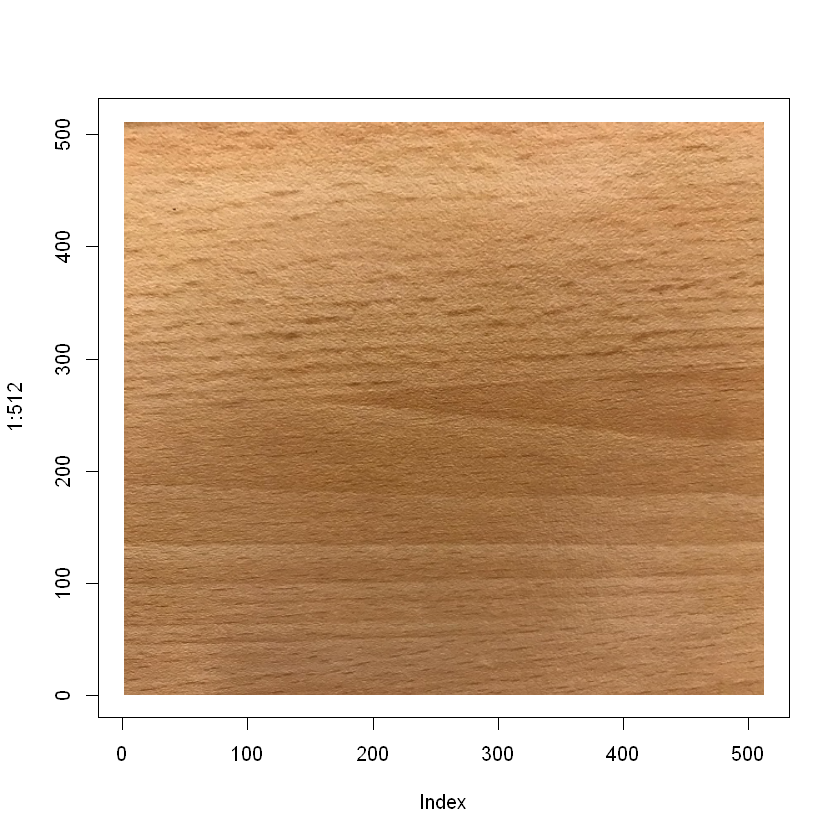

In [2]:
plot(1:512, type='n')
rasterImage(img, 1, 1, 512, 512)

#### 1.2.b

The images were rotating when we use the image function. To solve this problem, we took the transpose of the images. These are the plots for each channel, with order RGB:

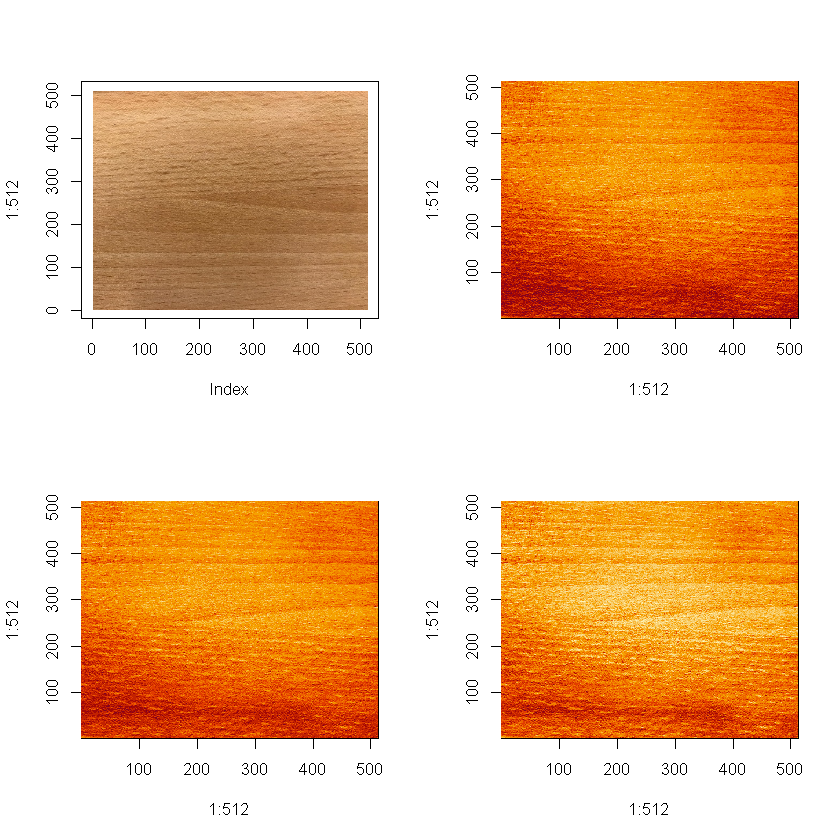

In [3]:
par(mfrow=c(2,2))
plot(1:512, type='n')
rasterImage(img, 1, 1, 512, 512)
image(1:512,1:512,t(img[,,1]))
image(1:512,1:512,t(img[,,2]))
image(1:512,1:512,t(img[,,3]))

### Part 1.3

We obtained the average of the columns for each channel by summing them all and then dividing to column length (512). The average of the columns for each channel can be seen in the same plot as follows with respect to channel colours:

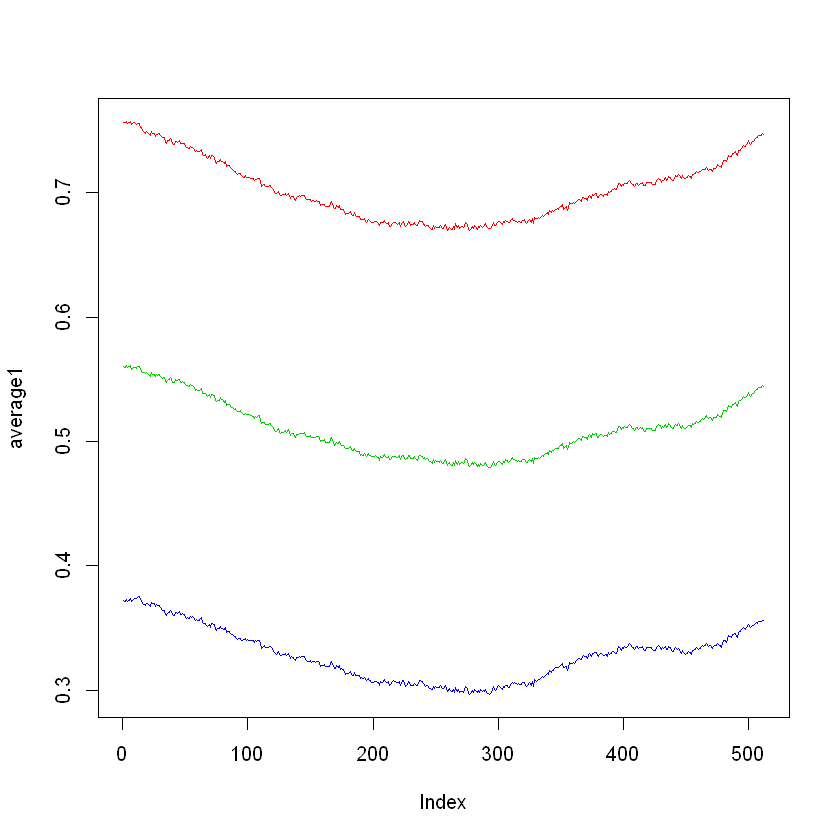

In [4]:
average1<-img[,1,1]
for(j in 1:512){
    average1[j]<-sum(img[,j,1])/512
  }
average2<-img[,1,2]
for(j in 1:512){
  average2[j]<-sum(img[,j,2])/512
  }
average3<-img[,1,3]
for(j in 1:512){
  average3[j]<-sum(img[,j,3])/512
  }
par(mfrow=c(1,1))

lb<-min(min(average1),min(average2),min(average3))
ub<-max(max(average1),max(average2),max(average3))

plot(average1, type = "l", col="2", ylim = range(lb,ub))
lines(average2, type = "l", col="3" )
lines(average3, type = "l", col="4" )

### Part 1.4

For each channel, we subtracted right half of the image from left half (halves were obtained by cropping the image vertically). As a result, the leftside of the image became blackish due to the subtraction leading the values become close to 0 (colour value of black), but the pattern of our image is still visible.

In [5]:
for(i in 1:512){
  for(j in 1:256){
    if((img[i,j,1]-img[i,j+256,1])>0){
       img[i,j,1]=img[i,j,1]-img[i,j+256,1]
    }
    else{
      img[i,j,1]=0
    }
    if((img[i,j,2]-img[i,j+256,2])>0){
      img[i,j,2]=img[i,j,2]-img[i,j+256,2]
    }
    else{
      img[i,j,2]=0
    }
    if((img[i,j,3]-img[i,j+256,3])>0){
      img[i,j,3]=img[i,j,3]-img[i,j+256,3]
    }
    else{
      img[i,j,3]=0
    }
    }
}

The new image is as follows:

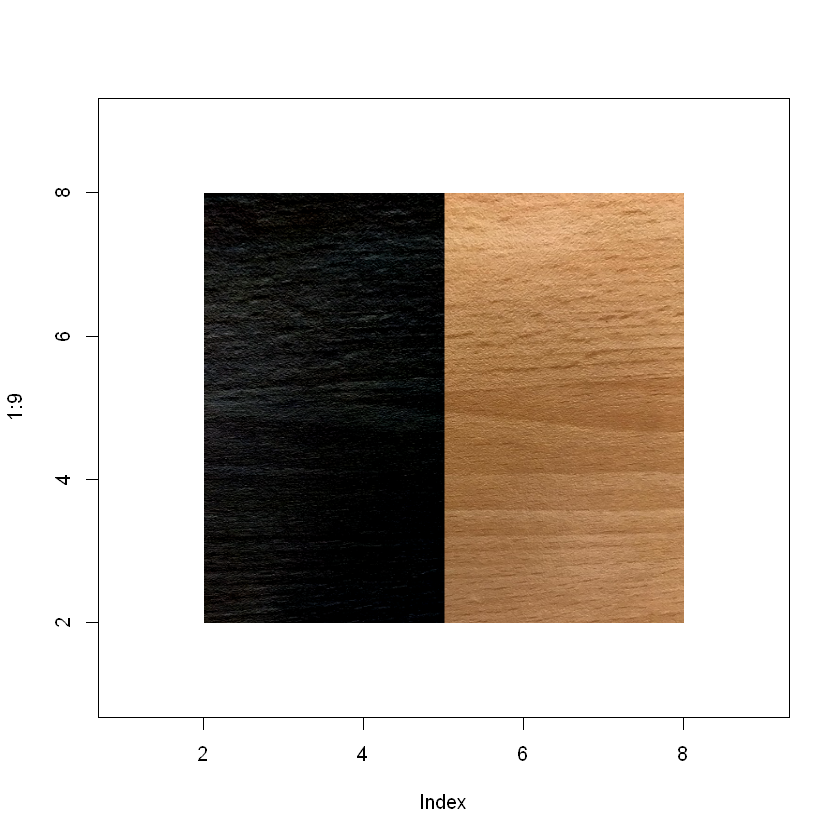

In [6]:
plot(1:9, type='n')
rasterImage(img, 2, 2, 8, 8)

### Part 1.5

Median filtering is applied by scanning all 5x5, 11x11 and 31x31 windows starting from the bottom left to the upper right and calculating the median for 25, 121 and 961 entries and equalizing the center window to the median by order. This process made image smoother and less noisy.

#### a. For 5x5

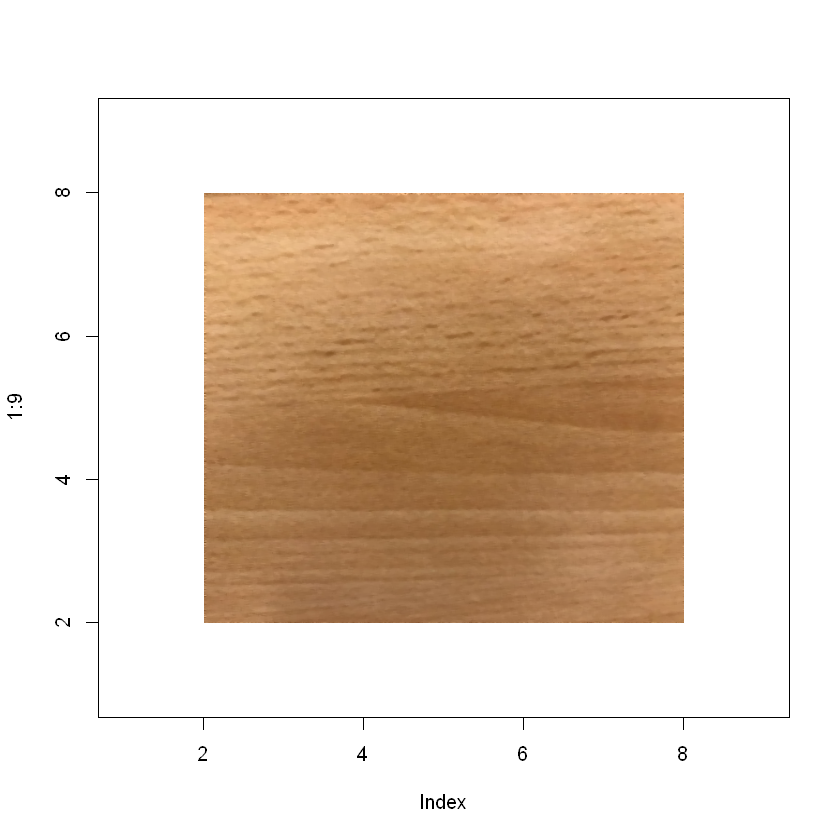

In [7]:
img<-readJPEG("C:/Users/ipeku/Desktop/IE423 Project P1/img2.jpg")
mat<-c(0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
mat1<-c(0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
mat2<-c(0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0)
x<-img
count=1
for(i in 1:508){
  for(j in 1:508){
    for(k in 0:4){
      for(l in 0:4){
    mat[count]=img[i+k,j+l,1]
    mat1[count]=img[i+k,j+l,2]
    mat2[count]=img[i+k,j+l,3]
    count=count+1
      }
      }
    count=1
    x[i+2,j+2,1]=median(mat)
    x[i+2,j+2,2]=median(mat1)
    x[i+2,j+2,3]=median(mat2)
    }
}
plot(1:9, type='n')
rasterImage(x, 2, 2, 8, 8)

#### b. For 11x11

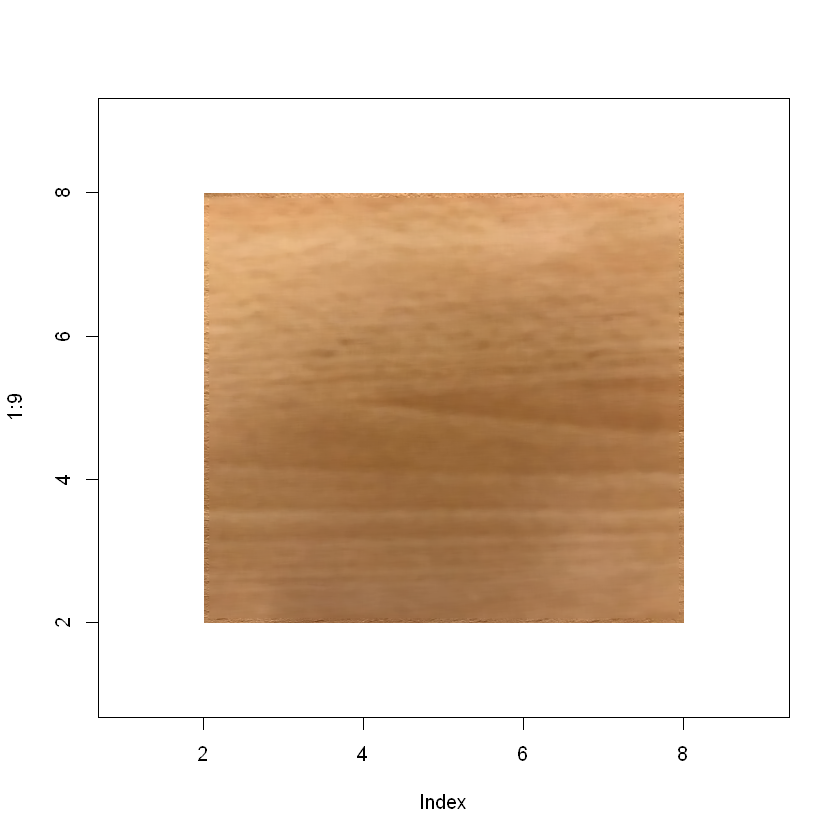

In [8]:
img<-readJPEG("C:/Users/ipeku/Desktop/IE423 Project P1/img2.jpg")
for(z in 0:120){
  mat[z]<-0
  mat1[z]<-0
  mat2[z]<-0
}
x<-img
count=1
for(i in 1:501){
  for(j in 1:501){
    for(k in 0:10){
      for(l in 0:10){
        mat[count]=img[i+k,j+l,1]
        mat1[count]=img[i+k,j+l,2]
        mat2[count]=img[i+k,j+l,3]
        count=count+1
      }
    }
    count=1
    x[i+5,j+5,1]=median(mat)
    x[i+5,j+5,2]=median(mat1)
    x[i+5,j+5,3]=median(mat2)
  }
}
plot(1:9, type='n')
rasterImage(x, 2, 2, 8, 8)

#### c. For 31x31

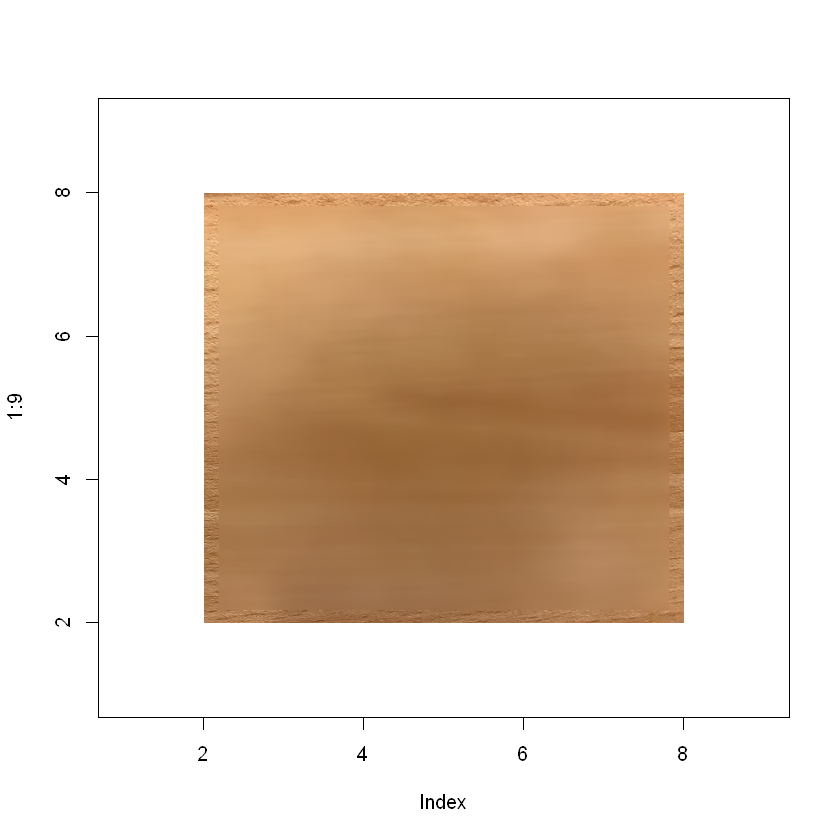

In [9]:
img<-readJPEG("C:/Users/ipeku/Desktop/IE423 Project P1/img2.jpg")
for(g in 0:960){
  mat[g]<-0
  mat1[g]<-0
  mat2[g]<-0
}
x<-img
count=1
for(i in 1:481){
  for(j in 1:481){
    for(k in 0:30){
      for(l in 0:30){
        mat[count]=img[i+k,j+l,1]
        mat1[count]=img[i+k,j+l,2]
        mat2[count]=img[i+k,j+l,3]
        count=count+1
      }
    }
    count=1
    x[i+15,j+15,1]=median(mat)
    x[i+15,j+15,2]=median(mat1)
    x[i+15,j+15,3]=median(mat2)
  }
}
plot(1:9, type='n')
rasterImage(x, 2, 2, 8, 8)

At the end, we observed that if the window sizes are increased, the image is becoming smoother and less noisy, which also seems blurry. 
The edges of the picture remained clear because as the window size gets bigger, the edges can't be calculated due to the lack of windows around them. 
If the window size gets even bigger, the blurry part of the image will be more blurry but its size will be smaller since the number of the pixels can't be made less noisy will increase.

# Part 2
### Part 2.1

This is the structure of the image chosen and the histogram of the pixel values for this part of the project:
Normally blue channel, red channel and green channel values are completely different but we changed the images colors to greyscale so the blue,red and green channel values are insignificant and equal to each other because of the changes to grey.

Warning message:
"package 'jpeg' is in use and will not be installed"

 num [1:512, 1:512, 1:3] 0.576 0.647 0.604 0.612 0.659 ...


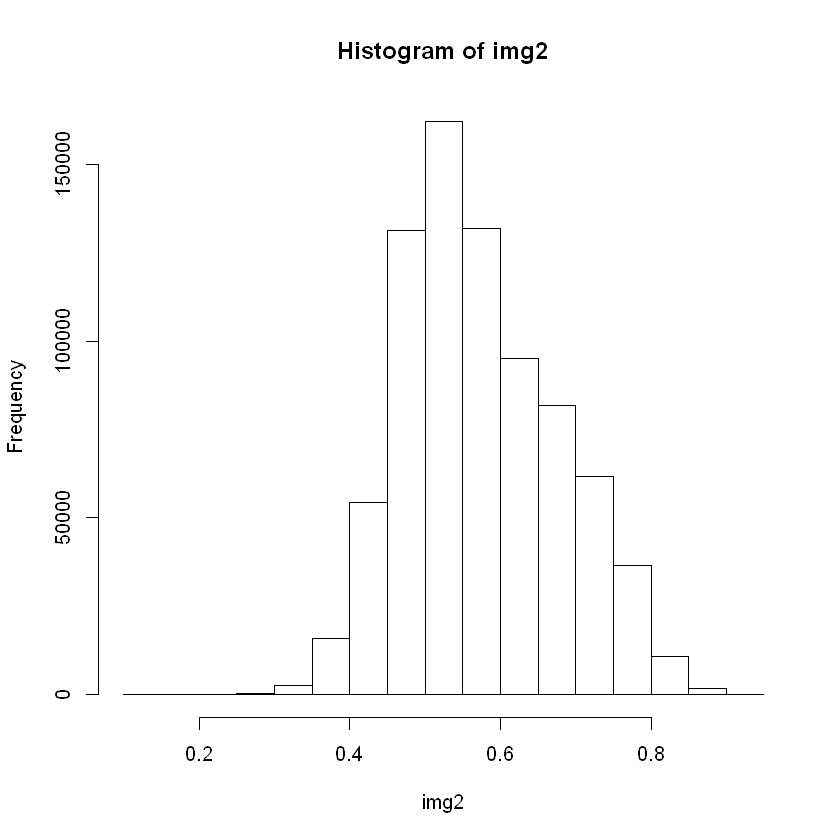

In [10]:
install.packages("jpeg")
library(jpeg)
img2<-readJPEG("C:/Users/ipeku/Desktop/IE423 Project P1/img3.jpg")
str(img2)
hist(img2)

# Part 2.2

According to the histogram of the pixel values of the grayscale image, we observed that the pixel values are likely to follow Normal distribution. Thus, we calculated the mean and variance of the pixel values of our image to obtain the parameters of the distribution. Mean of the distribution is 0.574785 and standard deviation of the distribution is 0.1032304.

In [11]:
m<-mean(img2)
m
sd<-var(img2)^0.5
sd

[1] 0.574785

[1] 0.1032304

# Part 2.3

We assumed that the parameters we found in part 2 are equal to the distribution parameters we proposed. According to the parameters, we constructed lower and upper bounds to identify the pixels that are out of the 0.999 confidence interval. After we found those pixels, we changed the values of these pixels to zero(black color). We observed that the extreme points which are in the brightest and darkest parts of the image are converted to pure dark color. As a result of that, when we compared the original and new image, we observed that some black dots has appeared in the new image.

[1] 0.2351026

[1] 0.9144673

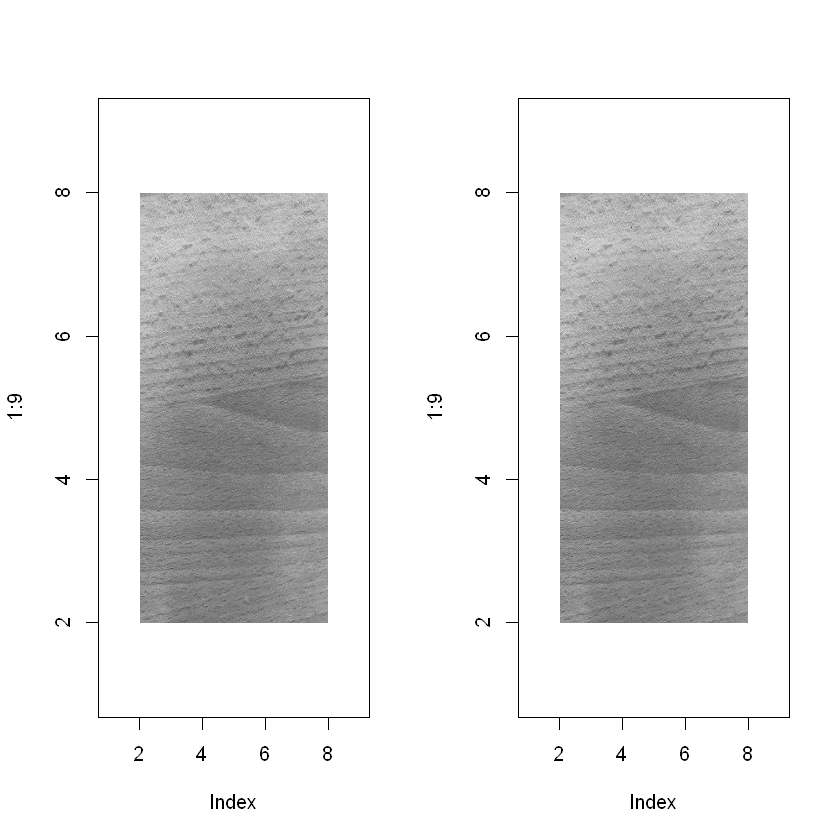

In [12]:
LB<-qnorm(0.0005,m,sd)
UB<-qnorm(0.9995,m,sd)
LB
UB

for(i in 1:512){
  for(j in 1:512){
    if(img2[i,j,1]<LB|img2[i,j,1]>UB){
      img2[i,j,1]=0
      }
    if(img2[i,j,2]<LB|img2[i,j,2]>UB){
      img2[i,j,2]=0
      }
    if(img2[i,j,3]<LB|img2[i,j,3]>UB){
      img2[i,j,3]=0
    }
  }
}
img_original<-readJPEG("C:/Users/ipeku/Desktop/IE423 Project P1/img3.jpg")
par(mfrow=c(1,2))
plot(1:9, type='n')
rasterImage(img_original, 2, 2, 8, 8)
plot(1:9, type='n')
rasterImage(img2, 2, 2, 8, 8)

# Part2.4

When we performed the same operation on the patches of images, we observed that the confidence interval changed for each patch compared to whole image. When we took the window size 51*51, we can control the images locally and we saw that the locally observation gives a better solution according to the observing the whole image. We calculated the mean and standard deviation for each patch and find outliers according to these parameters which gives a better result compared to obtaining parameters of the whole image. We didn't observe the black dots in the bright parts of the image in this way. Since our image color density is almost equally distributed, we didn't observe significant changes. With a high contrast image, results can be obtained better.

In [ ]:
newimage<-img_original
for(i in 1:10){
  for(j in 1:10){
    m=mean(newimage[(51*(i-1)+1):(51*(i-1)+51),(51*(j-1)+1):(51*(j-1)+51),1]) 
    sd<-var(newimage[(51*(i-1)+1):(51*(i-1)+51),(51*(j-1)+1):(51*(j-1)+51),1])^0.5
    LB<-qnorm(0.0005,m,sd)
    UB<-qnorm(0.9995,m,sd)
    for(k in (51*(i-1)+1):(51*(i-1)+51)){
      for(l in (51*(j-1)+1):(51*(j-1)+51)){
        if(newimage[k,l,1]<LB|newimage[k,l,1]>UB){
          newimage[k,l,1]=0
        }
        if(newimage[k,l,2]<LB|newimage[k,l,2]>UB){
          newimage[k,l,2]=0
        }
        if(newimage[k,l,3]<LB|newimage[k,l,3]>UB){
          newimage[k,l,3]=0
        }
      }
    }
  }
}
plot(1:9, type='n')
rasterImage(newimage, 2, 2, 8, 8)
plot(1:9, type='n')
rasterImage(img_original, 2, 2, 8, 8)
plot(1:9, type='n')
rasterImage(img2, 2, 2, 8, 8)
plot(1:9, type='n')
rasterImage(newimage, 2, 2, 8, 8)

Warning message in if (newimage[k, l, 1] < LB | newimage[k, l, 1] > UB) {:
"the condition has length > 1 and only the first element will be used"Warning message in if (newimage[k, l, 2] < LB | newimage[k, l, 2] > UB) {:
"the condition has length > 1 and only the first element will be used"Warning message in if (newimage[k, l, 3] < LB | newimage[k, l, 3] > UB) {:
"the condition has length > 1 and only the first element will be used"Warning message in if (newimage[k, l, 1] < LB | newimage[k, l, 1] > UB) {:
"the condition has length > 1 and only the first element will be used"Warning message in if (newimage[k, l, 2] < LB | newimage[k, l, 2] > UB) {:
"the condition has length > 1 and only the first element will be used"Warning message in if (newimage[k, l, 3] < LB | newimage[k, l, 3] > UB) {:
"the condition has length > 1 and only the first element will be used"Warning message in if (newimage[k, l, 1] < LB | newimage[k, l, 1] > UB) {:
"the condition has length > 1 and only the first elemen